In [1]:
# Modeling

In [2]:
from fastai.vision.all import *
from collections import Counter
import torch
import torch.nn as nn
import pandas as pd
import matplotlib.pyplot as plt
import numpy as np
from fastai.vision import *

In [3]:
# upsampled data with 10%prob for aspect ratio aug
dataset_path = '/kaggle/input/11upsampled-dataset-week7/11upsampled_week7'

# upsampled data with 20%prob for aspect ratio aug
# dataset_path = '/kaggle/input/10upsampled-week7/10upsampled_week7'

# upsampled data
# dataset_path = '/kaggle/input/07upsampled-dataset-week5/07upsampled_dataset_week5'

# original data
# dataset_path = '/kaggle/input/06splitted-dataset-week5/content/06splitted_dataset_week5'

aug = 'y'

In [4]:
set_seed(99, True)

In [5]:
if aug=='n':
    random.seed(99)
    fields = DataBlock(
        blocks=(ImageBlock, CategoryBlock), #x - image; y - single class
        get_items=get_image_files, #get image
        splitter=GrandparentSplitter(valid_name='val'),
        get_y=parent_label, #use parent folder as label
        item_tfms=Resize(224)
    )
    
elif aug=='y':
    random.seed(99)
    fields = DataBlock(
        blocks=(ImageBlock, CategoryBlock),
        get_items=get_image_files,
        get_y=parent_label,
        splitter=GrandparentSplitter(valid_name='val'),
        item_tfms=[Resize(224),RandomResizedCrop(size=224,min_scale=0.95, max_scale=1.05), RatioResize(224)],
#         item_tfms=Resize(224),
        batch_tfms=aug_transforms(do_flip=True, flip_vert=True,max_rotate=10
        , min_zoom=1,max_zoom=1.1
        , max_lighting=0.75,max_warp=0.2 
        , p_affine=0.75,p_lighting=0.75
        , xtra_tfms=None,size=None
        , mode='bilinear'
        , pad_mode=PadMode.Reflection
        , align_corners=True, batch=False, min_scale=1)
        )
dls = fields.dataloaders(dataset_path, bs=16)

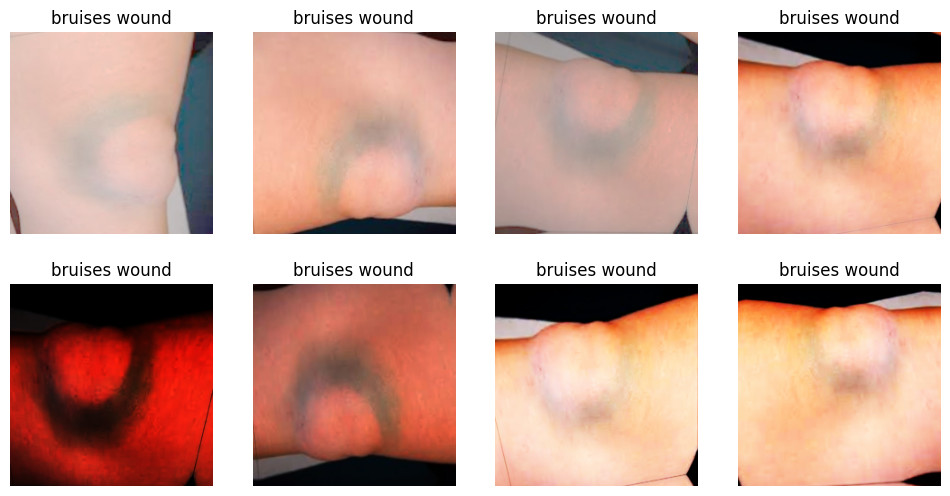

In [6]:
dls.train.show_batch(max_n=8, nrows=2,unique=True) #unique pic

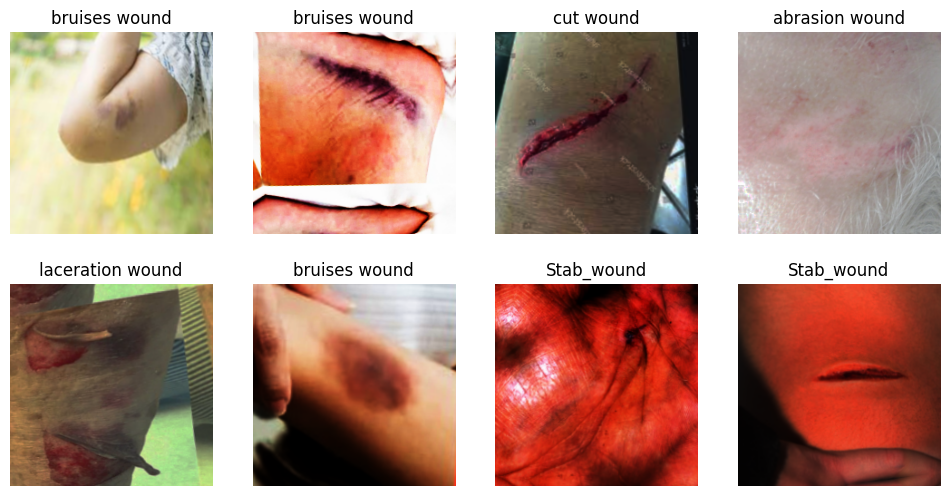

In [7]:
# dls.train.vocab
dls.train.show_batch(max_n=8, nrows=2)

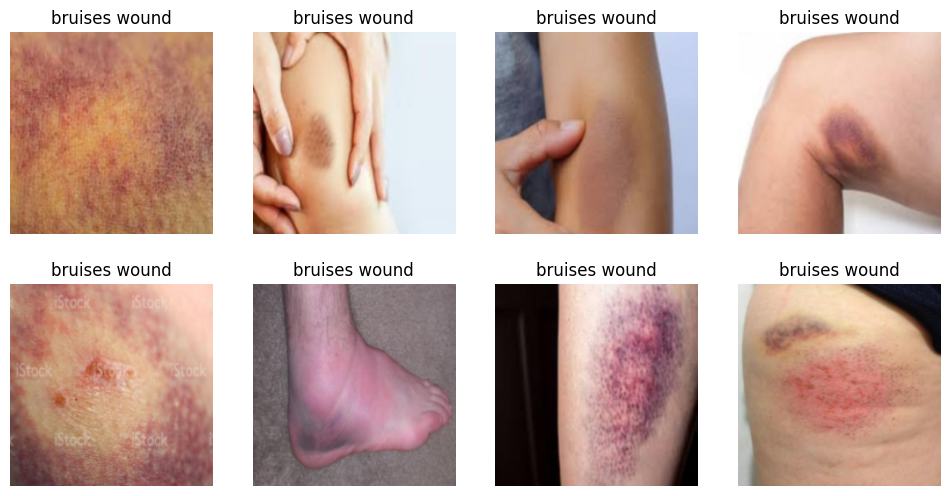

In [8]:
dls.valid.show_batch(max_n=8, nrows=2)

In [9]:
 def get_class_weights(dls):
    class_counts = torch.tensor([len(c) for c in dls.vocab])
    weights = 1.0 / class_counts
    weights = weights / weights.sum()
    return weights

def get_eff_class_weights(dls, beta):
    class_counts = torch.tensor([len(c) for c in dls.vocab], dtype=torch.float)
    eff_no = 1.0 - np.power(beta, class_counts.float())
    weights = (1.0 - beta) / np.array(eff_no, dtype=np.float32)
    weights = weights / weights.sum() * len(dls.vocab)
    return torch.from_numpy(weights)

In [10]:
weighting_method = 'ENS' # INS,ISNS,ENS
if weighting_method == 'INS':
    weighting = get_class_weights(dls)
elif weighting_method == 'ISNS':
    weighting = get_class_weights(dls)**0.5
elif weighting_method == 'ENS':
    weighting = get_eff_class_weights(dls,0.9)

In [11]:
weighting

tensor([1.0752, 0.9080, 0.9389, 1.0752, 1.1432, 0.8596])

Downloading: "https://download.pytorch.org/models/resnet50-11ad3fa6.pth" to /root/.cache/torch/hub/checkpoints/resnet50-11ad3fa6.pth
100%|██████████| 97.8M/97.8M [00:00<00:00, 161MB/s]


epoch,train_loss,train_error_rate,train_accuracy,train_f1_score,train_precision_score,train_recall_score,valid_loss,valid_error_rate,valid_accuracy,valid_f1_score,valid_precision_score,valid_recall_score,time
0,2.289585,0.644571,0.355429,0.351950,0.351865,0.352534,1.506906,0.470588,0.529412,0.441929,0.490655,0.448148,00:17


Better model found at epoch 0 with valid_loss value: 1.5069057941436768.


epoch,train_loss,train_error_rate,train_accuracy,train_f1_score,train_precision_score,train_recall_score,valid_loss,valid_error_rate,valid_accuracy,valid_f1_score,valid_precision_score,valid_recall_score,time
0,1.653298,0.511995,0.488005,0.483160,0.484524,0.484483,1.264278,0.364706,0.635294,0.553724,0.583747,0.586111,00:22
1,1.423079,0.461490,0.538510,0.531339,0.532120,0.533004,1.051913,0.341176,0.658824,0.574439,0.595437,0.600926,00:22
2,1.266153,0.424242,0.575758,0.572201,0.576761,0.571720,0.955756,0.258824,0.741176,0.708677,0.702863,0.738889,00:22
3,1.173986,0.390152,0.609848,0.604475,0.605850,0.605637,1.010058,0.294118,0.705882,0.650187,0.650144,0.672685,00:22
4,0.994220,0.327652,0.672348,0.668179,0.673042,0.668025,0.942947,0.235294,0.764706,0.718628,0.706085,0.755093,00:22
5,0.890350,0.309975,0.690025,0.686831,0.689064,0.686398,0.791010,0.223529,0.776471,0.736866,0.725589,0.768981,00:22
6,0.752754,0.266414,0.733586,0.729444,0.732497,0.729801,0.750605,0.235294,0.764706,0.710852,0.726028,0.707870,00:22
7,0.673679,0.236742,0.763258,0.760258,0.765927,0.758802,0.714898,0.247059,0.752941,0.714739,0.723068,0.719907,00:22
8,0.617220,0.215909,0.784091,0.781756,0.782671,0.781242,0.656620,0.164706,0.835294,0.806367,0.812996,0.805556,00:22
9,0.555192,0.193182,0.806818,0.804821,0.809539,0.803861,0.627513,0.200000,0.800000,0.767299,0.790293,0.762500,00:22


Better model found at epoch 0 with valid_loss value: 1.264277696609497.
Better model found at epoch 1 with valid_loss value: 1.0519131422042847.
Better model found at epoch 2 with valid_loss value: 0.9557563066482544.
Better model found at epoch 4 with valid_loss value: 0.942947268486023.
Better model found at epoch 5 with valid_loss value: 0.7910100817680359.
Better model found at epoch 6 with valid_loss value: 0.7506048679351807.
Better model found at epoch 7 with valid_loss value: 0.7148984670639038.
Better model found at epoch 8 with valid_loss value: 0.656619668006897.
Better model found at epoch 9 with valid_loss value: 0.6275128722190857.
Better model found at epoch 11 with valid_loss value: 0.48871809244155884.


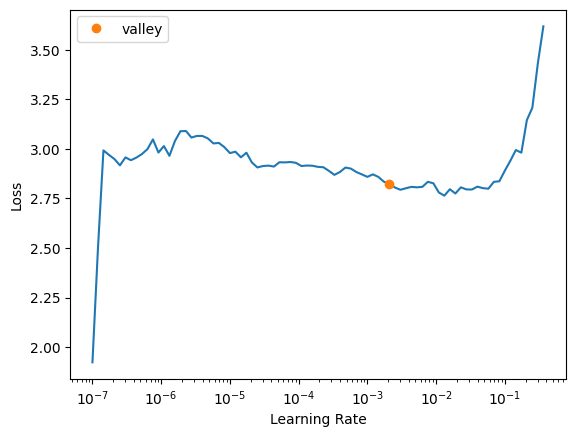

In [13]:
set_seed(99, True)
metrics = [error_rate, accuracy, F1Score(average='macro'), Precision(average='macro'), Recall(average='macro')]
arch = resnet50

learner = vision_learner(dls, arch,
                         opt_func = Adam,
                         loss_func=CrossEntropyLossFlat(weight=weighting),
#                          loss_func=FocalLossFlat(gamma=2),
                         metrics=metrics)

learner.recorder.train_metrics = True
learner.recorder.valid_metrics = True
recorder = learner.recorder

learner.fine_tune(epochs=20, base_lr=learner.lr_find()[0],cbs=[CSVLogger(fname='history.csv', append=False), SaveModelCallback(monitor="valid_loss", fname='best_model')])#, wd=0.1))
# learner.fit(n_epoch=20, lr=learner.lr_find()[0],cbs=[CSVLogger(fname='history.csv', append=False), SaveModelCallback(monitor="valid_loss", fname='best_model')])#, wd=0.1)
# learner.fit_one_cycle(n_epoch=20, lr_max=learner.lr_find()[0],cbs=[CSVLogger(fname='history.csv', append=False), SaveModelCallback(monitor="valid_loss", fname='best_model')])#, wd=0.1)

                  precision    recall  f1-score   support

      Stab_wound       1.00      1.00      1.00         6
  abrasion wound       0.80      0.80      0.80        10
   bruises wound       1.00      0.87      0.93        15
      burn wound       0.97      0.92      0.94        36
       cut wound       0.55      0.75      0.63         8
laceration wound       0.73      0.80      0.76        10

        accuracy                           0.87        85
       macro avg       0.84      0.86      0.84        85
    weighted avg       0.89      0.87      0.88        85



[('burn wound', 'cut wound', 2),
 ('cut wound', 'laceration wound', 2),
 ('laceration wound', 'cut wound', 2),
 ('abrasion wound', 'burn wound', 1),
 ('abrasion wound', 'laceration wound', 1),
 ('bruises wound', 'abrasion wound', 1),
 ('bruises wound', 'cut wound', 1),
 ('burn wound', 'abrasion wound', 1)]

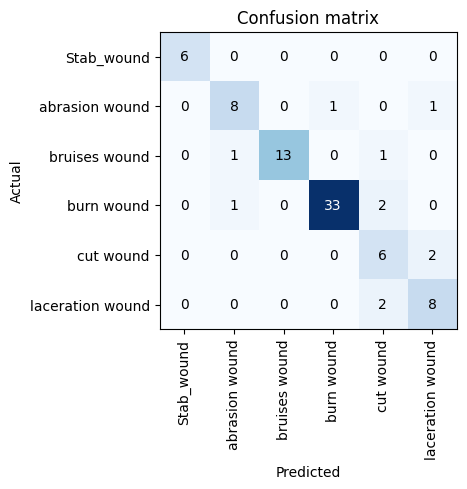

In [14]:
interp = ClassificationInterpretation.from_learner(learner, dl=dls.valid)
interp.plot_confusion_matrix()
interp.print_classification_report()
interp.most_confused()

/opt/conda/lib/python3.10/site-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


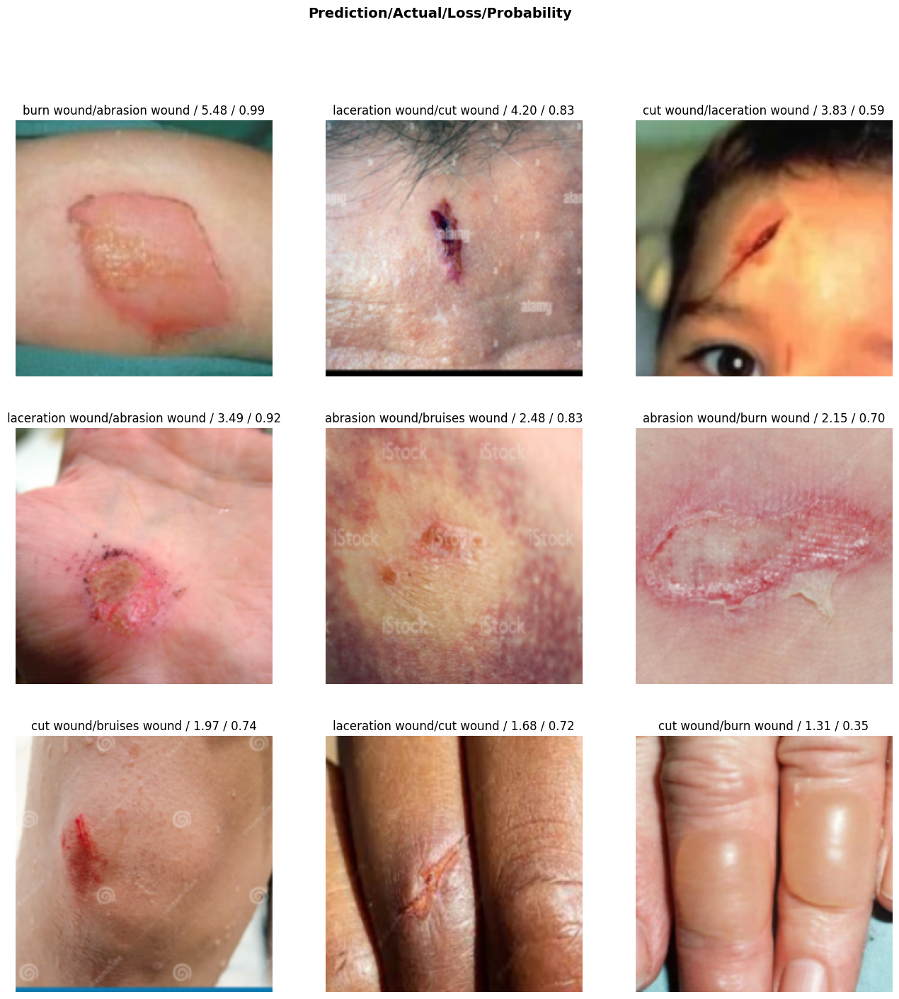

In [15]:
interp.plot_top_losses(9, figsize= (16,16))

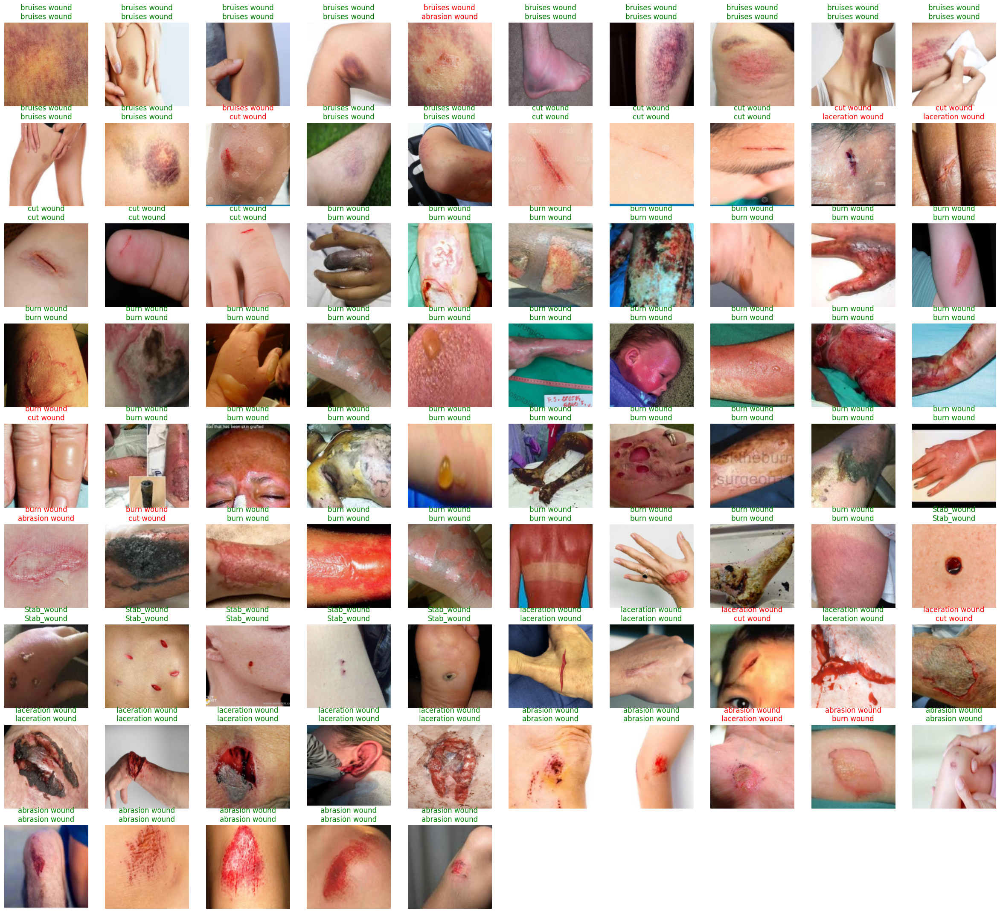

In [16]:
# learner.show_results()
interp.show_results(list(range(85)))

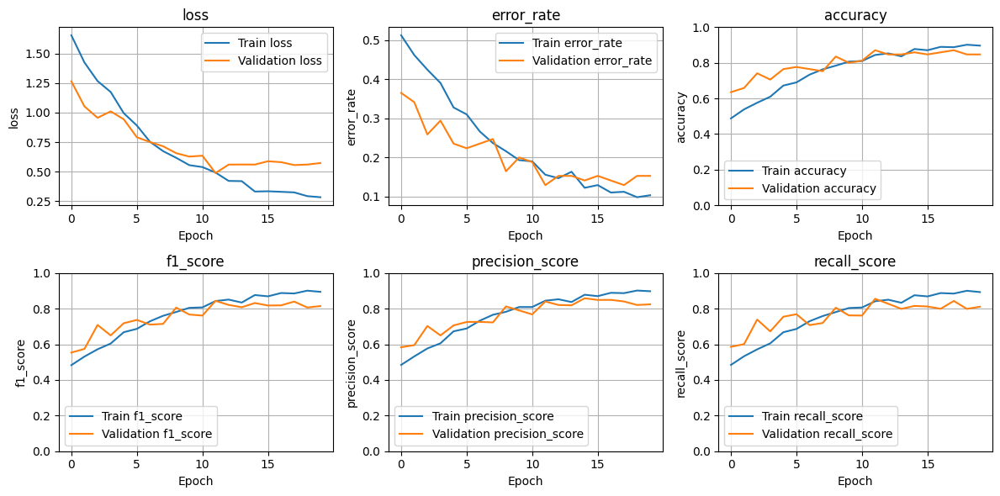

In [17]:
history_df = pd.read_csv("history.csv")
metrics_to_plot = ["loss","error_rate", "accuracy", "f1_score", "precision_score", "recall_score"]

rows = 2
cols = int(len(metrics_to_plot) / rows) + (len(metrics_to_plot) % rows > 0)
fig, axes = plt.subplots(rows, cols, figsize=(12, 6))  
axes_flat = axes.flatten()

for metric, ax in zip(metrics_to_plot, axes_flat):
    
    train_metric = history_df[f"train_{metric}"]
    val_metric = history_df[f"valid_{metric}"]

    ax.plot(train_metric, label=f"Train {metric}")
    ax.plot(val_metric, label=f"Validation {metric}")
    ax.set_xlabel("Epoch")
    ax.set_ylabel(metric)
    ax.set_title(f"{metric}")
    ax.legend()
    ax.grid(True)
    if metric in ["accuracy", "f1_score", "precision_score", "recall_score"]:
        ax.set_ylim(0, 1)
        
plt.tight_layout()
plt.show()

In [18]:
learner.export('/kaggle/working/11-aug-ens-resnet50.pkl')
best_learner = learner

In [19]:
# best_learner = vision_learner(dls, arch,
#                          opt_func = Adam,
#                          loss_func=FocalLossFlat(gamma=2),
#                          metrics=metrics)
# best_learner.load("/kaggle/working/models/best_model")

                  precision    recall  f1-score   support

      Stab_wound       1.00      1.00      1.00         6
  abrasion wound       0.80      0.80      0.80        10
   bruises wound       1.00      0.87      0.93        15
      burn wound       0.97      0.92      0.94        36
       cut wound       0.55      0.75      0.63         8
laceration wound       0.73      0.80      0.76        10

        accuracy                           0.87        85
       macro avg       0.84      0.86      0.84        85
    weighted avg       0.89      0.87      0.88        85



[('burn wound', 'cut wound', 2),
 ('cut wound', 'laceration wound', 2),
 ('laceration wound', 'cut wound', 2),
 ('abrasion wound', 'burn wound', 1),
 ('abrasion wound', 'laceration wound', 1),
 ('bruises wound', 'abrasion wound', 1),
 ('bruises wound', 'cut wound', 1),
 ('burn wound', 'abrasion wound', 1)]

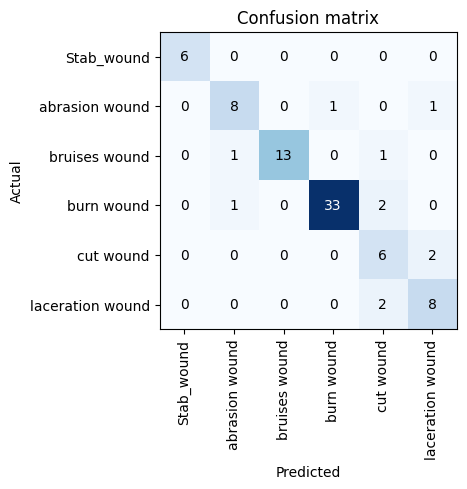

In [20]:
b_interp = ClassificationInterpretation.from_learner(best_learner, dl=dls.valid)
b_interp.plot_confusion_matrix()
b_interp.print_classification_report()
b_interp.most_confused()

# Evaluation

In [21]:
test_dblock = DataBlock(
    blocks=(ImageBlock, CategoryBlock),
    get_items=get_image_files,
    splitter=GrandparentSplitter(valid_name='test'),
    get_y=parent_label,
    item_tfms=Resize(244)
    )
test_dls = test_dblock.dataloaders(dataset_path, bs=64)

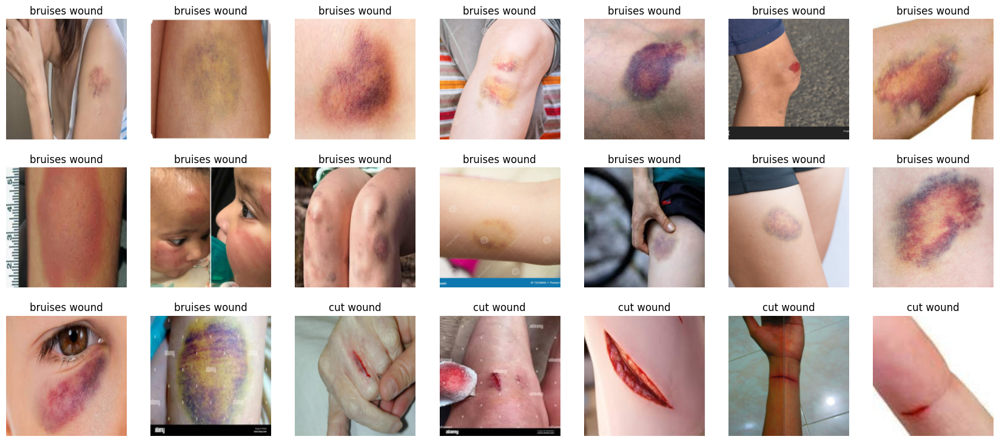

In [22]:
test_dls[1].show_batch(max_n=21, nrows=3)

                  precision    recall  f1-score   support

      Stab_wound       0.36      0.83      0.50         6
  abrasion wound       0.89      0.73      0.80        11
   bruises wound       0.88      0.94      0.91        16
      burn wound       0.86      0.82      0.84        38
       cut wound       0.75      0.60      0.67        10
laceration wound       0.71      0.50      0.59        10

        accuracy                           0.77        91
       macro avg       0.74      0.74      0.72        91
    weighted avg       0.81      0.77      0.78        91



[('burn wound', 'Stab_wound', 4),
 ('laceration wound', 'Stab_wound', 2),
 ('laceration wound', 'burn wound', 2),
 ('Stab_wound', 'burn wound', 1),
 ('abrasion wound', 'Stab_wound', 1),
 ('abrasion wound', 'burn wound', 1),
 ('abrasion wound', 'cut wound', 1),
 ('bruises wound', 'Stab_wound', 1),
 ('burn wound', 'bruises wound', 1),
 ('burn wound', 'cut wound', 1),
 ('burn wound', 'laceration wound', 1),
 ('cut wound', 'Stab_wound', 1),
 ('cut wound', 'abrasion wound', 1),
 ('cut wound', 'burn wound', 1),
 ('cut wound', 'laceration wound', 1),
 ('laceration wound', 'bruises wound', 1)]

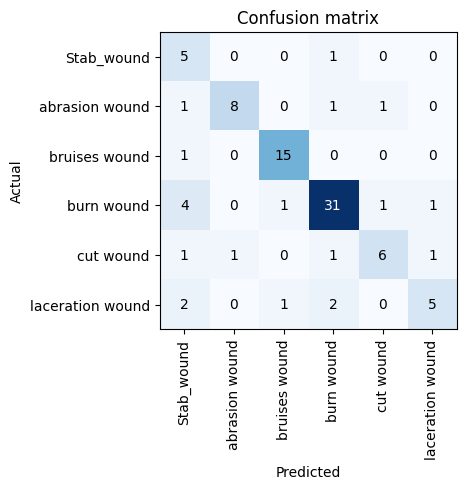

In [23]:
test_interp = ClassificationInterpretation.from_learner(best_learner, dl=test_dls.valid)
# test_interp = ClassificationInterpretation.from_learner(best_learner, dl=test_dls[1])
test_interp.plot_confusion_matrix()
test_interp.print_classification_report()
test_interp.most_confused()

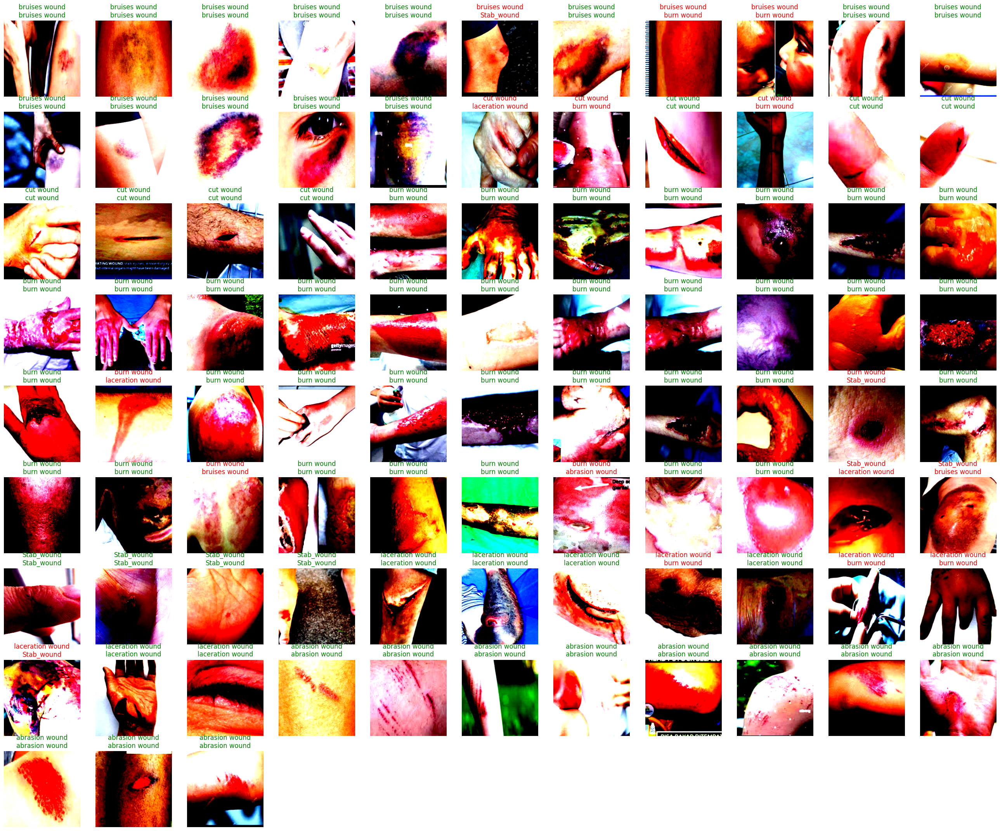

In [24]:
test_interp.show_results(list(range(91)))

In [25]:
# evaluation dataframe

import os

def predict_all_images(test_folder, model):
  results = []  

  for subfolder in os.listdir(test_folder):
    actual_class = subfolder

    if os.path.isdir(os.path.join(test_folder, subfolder)):
      for filename in os.listdir(os.path.join(test_folder, subfolder)):
        image_path = os.path.join(test_folder, subfolder, filename)

        pred_class, class_num, prob = best_learner.predict(image_path)
        
        result = {
            "actual_class": actual_class,
            "predicted_class": pred_class,
            "filename": filename,
            "probability": float(max(prob))
        }
        results.append(result)

  return results

model = best_learner
test_folder = dataset_path+'/test'

predictions = predict_all_images(test_folder, model)

df = pd.DataFrame(predictions)
df = df.sort_values(by=['actual_class', 'filename'])

In [26]:
# accuracy
len(df.loc[df.actual_class == df.predicted_class])/len(df)

0.8241758241758241

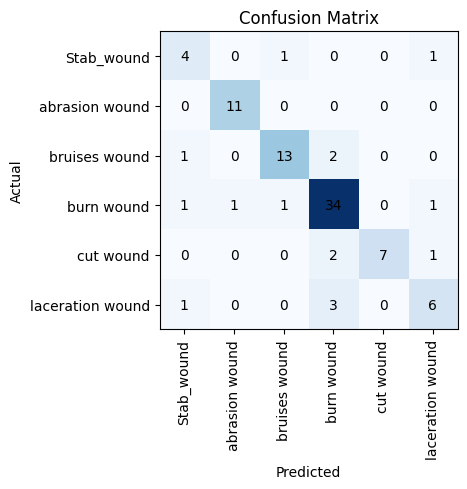

In [27]:
class_labels = test_dls.vocab
confusion_matrix = pd.crosstab(df['actual_class'], df['predicted_class'], rownames=['Actual'], colnames=['Predicted'])

fig, ax = plt.subplots(figsize=(5, 5)) 
ax.imshow(confusion_matrix, cmap=plt.cm.Blues) 

ax.set_xticks(np.arange(len(class_labels)))
ax.set_yticks(np.arange(len(class_labels)))
ax.set_xticklabels(class_labels, rotation=90)
ax.set_yticklabels(class_labels)
ax.set_title('Confusion Matrix')
for i in range(len(class_labels)):
    for j in range(len(class_labels)):
        ax.text(j, i, str(confusion_matrix.iloc[i, j]), ha="center", va="center")
        
ax.set_ylabel('Actual')
ax.set_xlabel('Predicted')

plt.tight_layout()
plt.show()

/opt/conda/lib/python3.10/site-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/opt/conda/lib/python3.10/site-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


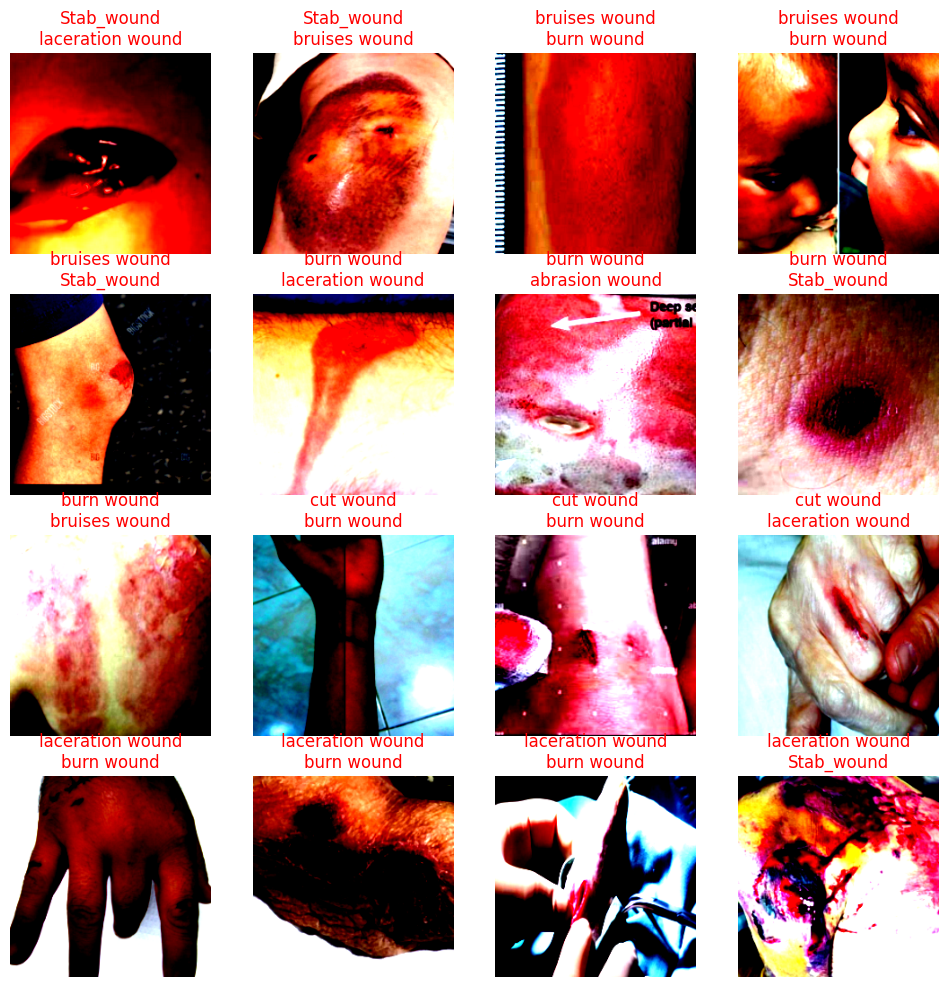

In [28]:
incorrect_indices = df[df['actual_class'] != df['predicted_class']].index.tolist()
test_interp.show_results(incorrect_indices)

In [29]:
from sklearn.metrics import classification_report
import pandas as pd

def print_classification_report(actual, predicted, labels):
    report = classification_report(actual, predicted, target_names=labels, output_dict=True)
    
    print("{:<20} {:<10} {:<10} {:<10} {:<10}".format('Class', 'Precision', 'Recall', 'F1-Score', 'Support'))
    
    for label in labels:
        precision = report[label]['precision']
        recall = report[label]['recall']
        f1_score = report[label]['f1-score']
        support = report[label]['support']
        print("{:<20} {:<10.2f} {:<10.2f} {:<10.2f} {:<10}".format(label, precision, recall, f1_score, support))
    
    accuracy = report['accuracy']
    macro_avg_precision = report['macro avg']['precision']
    macro_avg_recall = report['macro avg']['recall']
    macro_avg_f1_score = report['macro avg']['f1-score']
    macro_avg_support = report['macro avg']['support']
    weighted_avg_precision = report['weighted avg']['precision']
    weighted_avg_recall = report['weighted avg']['recall']
    weighted_avg_f1_score = report['weighted avg']['f1-score']
    weighted_avg_support = report['weighted avg']['support']
    
    print("{:<20} {:<10.2f} {:<10} {:<10} {:<10}".format('accuracy', accuracy, '', '', ''))
    print("{:<20} {:<10.2f} {:<10.2f} {:<10.2f} {:<10}".format('macro avg', macro_avg_precision, macro_avg_recall, macro_avg_f1_score, macro_avg_support))
    print("{:<20} {:<10.2f} {:<10.2f} {:<10.2f} {:<10}".format('weighted avg', weighted_avg_precision, weighted_avg_recall, weighted_avg_f1_score, weighted_avg_support))

actual = df['actual_class']
predicted = df['predicted_class']
labels = df['actual_class'].unique()

print_classification_report(actual, predicted, labels)

Class                Precision  Recall     F1-Score   Support   
Stab_wound           0.57       0.67       0.62       6         
abrasion wound       0.92       1.00       0.96       11        
bruises wound        0.87       0.81       0.84       16        
burn wound           0.83       0.89       0.86       38        
cut wound            1.00       0.70       0.82       10        
laceration wound     0.67       0.60       0.63       10        
accuracy             0.82                                       
macro avg            0.81       0.78       0.79       91        
weighted avg         0.83       0.82       0.82       91        
